In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.3/872.3 kB 14.2 MB/s eta 0:00:00


In [ ]:
!pip install -q opencv_jupyter_ui

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.9/122.9 kB 9.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import dataclasses
import glob
import matplotlib.pyplot as plt
import os
import random
import ultralytics
from ultralytics import YOLO
import shutil
import opencv_jupyter_ui as jcv2
import time

In [ ]:
# Enable 3rd party widgets to show the video
from google.colab import output

output.enable_custom_widget_manager()

In [ ]:
# Download the dataset.
!kaggle datasets download -d iasadpanwhar/football-player-detection-yolov8

Dataset URL: https://www.kaggle.com/datasets/iasadpanwhar/football-player-detection-yolov8
License(s): apache-2.0
100% 1.08G/1.08G [00:19<00:00, 134MB/s]
100% 1.08G/1.08G [00:19<00:00, 61.1MB/s]


In [ ]:
!unzip football-player-detection-yolov8.zip

Streaming output truncated to the last 5000 lines.
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.915832d79a3d37f91f4e8f366dba4011.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.a6f61041d0d71d3c552bf89d15f25e7c.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.b0b980c42aed6497899a351c7037e6a5.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.d28257b7abf390c4bbbf19036a3f7ff5.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.e0b632703461a185ffeaf01d1f17097d.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.f3a3ec9665bb19800ef952f6f895d93d.txt  
  inflating: football_players_detection/football_players_detection/train/labels/55011_jpg.rf.fafc9a615f75ccdf571b7b373e132112.txt  
  inflating: football_pla

# Visualization

In [ ]:
def read_image(path: str):
    """Reads the image in RGB instead of BGR."""
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def show_random_image(split: str):
    """Shows a random image from the given dataset."""
    paths = glob.glob(f"/content/football_players_detection/football_players_detection/{split}/images/*.jpg")
    image = read_image(random.choice(paths))
    plt.imshow(image)
    plt.show()

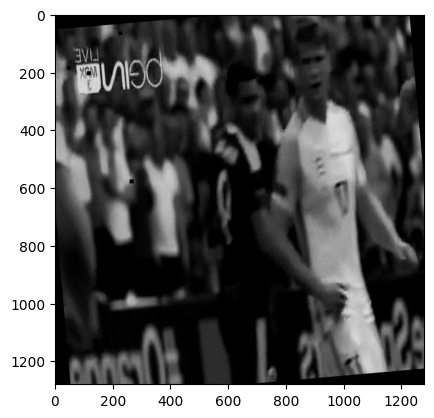

In [ ]:
show_random_image("train")

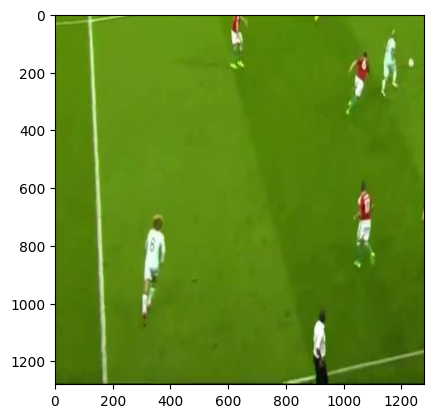

In [ ]:
show_random_image("valid")

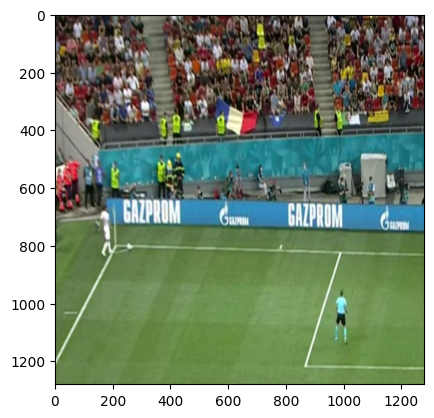

In [ ]:
show_random_image("test")

In [ ]:
class_names = ("football", "player")

@dataclasses.dataclass
class Label:
    class_id: int
    x_center: float
    y_center: float
    width: float
    height: float

def read_label_file(path: str) -> list[Label]:
    """Reads the label file and returns a list of labels."""
    labels: list[Label] = []

    with open(path) as f:
        # Each line in the file follows the following pattern:
        # class_id x_center y_center width height
        for line in f:
            class_id, x_center, y_center, width, height = line.split(" ")
            label = Label(
                class_id=int(class_id),
                x_center=float(x_center),
                y_center=float(y_center),
                width=float(width),
                height=float(height),
            )
            labels.append(label)

    return labels

In [ ]:
def show_image_with_labels(image_path: str, label_path: str):
    """Shows the image and the detected objects in that image."""
    image = read_image(image_path)
    labels = read_label_file(label_path)

    image_height = image.shape[0]
    image_width = image.shape[1]

    plt.imshow(image)

    for label in labels:
        x = label.x_center * image_width
        y = label.y_center * image_height
        width = label.width * image_width
        height = label.height * image_height

        x_min = x - width / 2
        x_max = x + width / 2
        y_min = y - height / 2
        y_max = y + height / 2

        plt.plot(
            (x_min, x_min, x_max, x_max, x_min),
            (y_min, y_max, y_max, y_min, y_min),
            color="red",
        )

    plt.show()

def show_random_image_with_labels(split: str):
    image_paths = glob.glob(f"/content/football_players_detection/football_players_detection/{split}/images/*.jpg")
    image_path = random.choice(image_paths)
    label_path = image_path.replace("images", "labels").replace(".jpg", ".txt")
    show_image_with_labels(image_path, label_path)

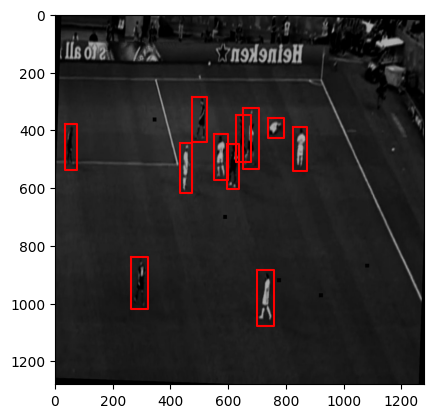

In [ ]:
show_random_image_with_labels("train")

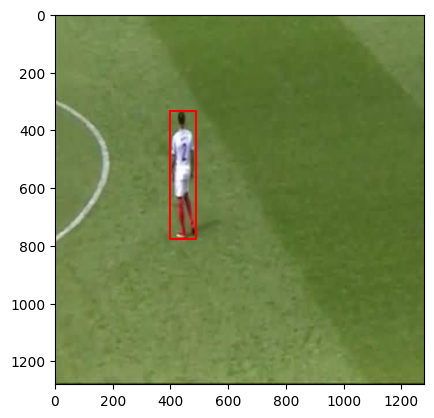

In [ ]:
show_random_image_with_labels("valid")

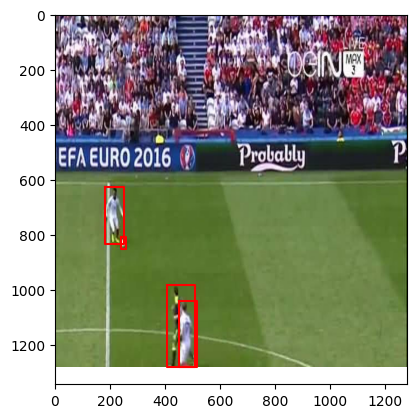

In [ ]:
show_random_image_with_labels("test")

In [ ]:
def visualize_labels(split: str):
    paths = glob.glob(f"dataset/{split}/labels/*.txt")
    labels = [read_label_file(path) for path in paths]
    class_ids = [label.class_id for image_labels in labels for label in image_labels]

    _, _, bars = plt.hist(class_ids)
    plt.bar_label(bars)
    plt.xticks(range(len(class_names)), class_names)
    plt.show()

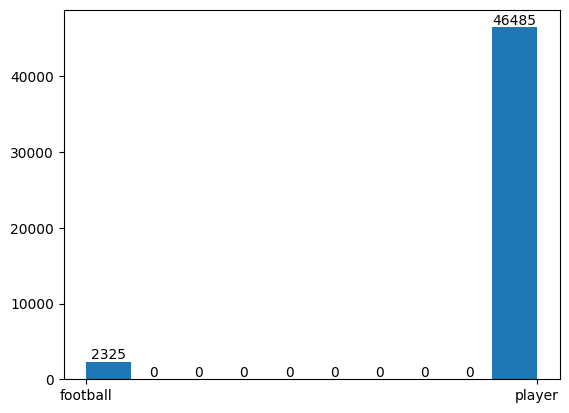

In [ ]:
visualize_labels("train")

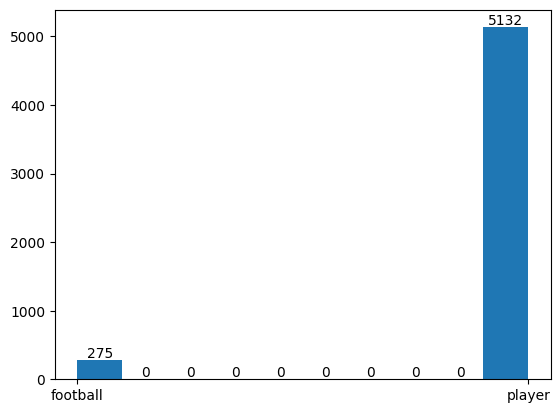

In [ ]:
visualize_labels("valid")

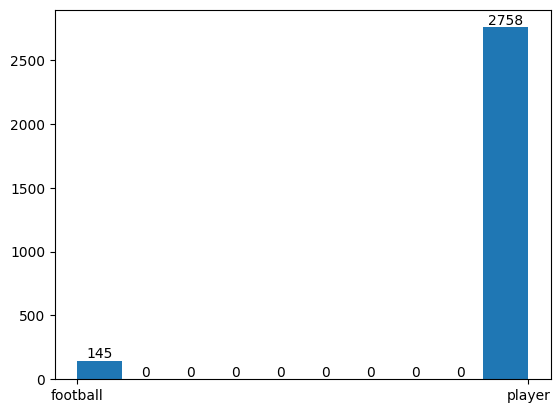

In [ ]:
visualize_labels("test")

#Training

In [ ]:
!mkdir /content/football_players_detection/football_players_detection/test/images-preprocessed

In [ ]:
IMAGE_SIZE = 640

for image_path in glob.glob("/content/football_players_detection/football_players_detection/test/images/*.jpg"):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
    filename = os.path.basename(image_path)
    cv2.imwrite(f"/content/football_players_detection/football_players_detection/test/images-preprocessed/{filename}", image)

In [ ]:
#Load the model
model = YOLO("yolov8n.yaml")

#Train the model
results = model.train(data="/content/football_players_detection/football_players_detection/data.yaml", epochs=30, imgsz= 640)

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/football_players_detection/football_players_detection/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

train: Scanning /content/football_players_detection/football_players_detection/train/labels.cache... 10308 images, 623 backgrounds, 0 corrupt: 100%|██████████| 10308/10308 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/football_players_detection/football_players_detection/valid/labels.cache... 972 images, 30 backgrounds, 0 corrupt: 100%|██████████| 972/972 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.39G      2.934      2.638      2.626         26        640: 100%|██████████| 645/645 [04:19<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


                   all        972       5407       0.91      0.328      0.366      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.4G      1.865      1.371      1.633         40        640: 100%|██████████| 645/645 [04:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


                   all        972       5407      0.567      0.428      0.454      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.39G      1.721      1.202      1.492         14        640: 100%|██████████| 645/645 [04:19<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


                   all        972       5407      0.722      0.483      0.521      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.41G      1.617      1.089      1.407         23        640: 100%|██████████| 645/645 [04:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.58it/s]


                   all        972       5407       0.71      0.512      0.543      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.37G      1.567      1.023      1.367         23        640: 100%|██████████| 645/645 [04:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.58it/s]


                   all        972       5407      0.789       0.55       0.59      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.38G      1.521      0.978      1.328         12        640: 100%|██████████| 645/645 [04:16<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


                   all        972       5407      0.902      0.546      0.615      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.5G      1.493     0.9389      1.312         17        640: 100%|██████████| 645/645 [04:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.36it/s]

                   all        972       5407      0.796      0.589       0.63      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.38G      1.465     0.9029      1.289         58        640: 100%|██████████| 645/645 [04:12<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


                   all        972       5407      0.828       0.59      0.642      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.45G      1.439     0.8745      1.271         39        640: 100%|██████████| 645/645 [04:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.67it/s]

                   all        972       5407      0.876      0.598      0.645      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.38G      1.425     0.8605      1.263         24        640: 100%|██████████| 645/645 [04:21<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


                   all        972       5407      0.865      0.607      0.657      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.35G      1.402     0.8265      1.247         31        640: 100%|██████████| 645/645 [04:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:14<00:00,  2.11it/s]


                   all        972       5407      0.877      0.613      0.667      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.39G      1.381     0.8158      1.236         14        640: 100%|██████████| 645/645 [04:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

                   all        972       5407      0.873       0.61      0.668      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.37G      1.368     0.7987      1.228         12        640: 100%|██████████| 645/645 [04:19<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.30it/s]


                   all        972       5407      0.852       0.63      0.676      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.48G      1.372     0.7969      1.225         21        640: 100%|██████████| 645/645 [04:23<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.71it/s]

                   all        972       5407      0.851      0.617       0.66      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.44G      1.353     0.7885      1.223         19        640: 100%|██████████| 645/645 [04:19<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.40it/s]

                   all        972       5407      0.897      0.632      0.691      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.39G      1.337     0.7707      1.216         14        640: 100%|██████████| 645/645 [04:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.22it/s]

                   all        972       5407      0.928      0.627      0.698      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.38G      1.333     0.7571      1.203         41        640: 100%|██████████| 645/645 [04:16<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:14<00:00,  2.08it/s]

                   all        972       5407      0.834      0.651      0.702      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.44G      1.323     0.7432      1.197         30        640: 100%|██████████| 645/645 [04:23<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.31it/s]


                   all        972       5407      0.916      0.634      0.704      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.38G      1.311     0.7385      1.194         26        640: 100%|██████████| 645/645 [04:16<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


                   all        972       5407      0.873      0.634        0.7      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.38G        1.3     0.7298      1.191         17        640: 100%|██████████| 645/645 [04:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.26it/s]


                   all        972       5407      0.887      0.652      0.722      0.419
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.67G      1.247      0.668      1.202         30        640: 100%|██████████| 645/645 [04:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.26it/s]


                   all        972       5407      0.879      0.649      0.707       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.37G      1.226     0.6497      1.193          4        640: 100%|██████████| 645/645 [04:05<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.48it/s]

                   all        972       5407      0.885      0.643      0.714       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.37G      1.219     0.6411      1.181          5        640: 100%|██████████| 645/645 [04:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.25it/s]


                   all        972       5407      0.873      0.655      0.733      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.37G      1.207     0.6288       1.18         13        640: 100%|██████████| 645/645 [04:05<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.63it/s]

                   all        972       5407      0.881      0.657      0.736       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.33G      1.192     0.6194      1.169         23        640: 100%|██████████| 645/645 [04:03<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.24it/s]


                   all        972       5407      0.879      0.666      0.746      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.35G      1.183     0.6098      1.167         17        640: 100%|██████████| 645/645 [04:03<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.80it/s]

                   all        972       5407      0.852      0.684      0.746      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.35G      1.178     0.6057      1.164          9        640: 100%|██████████| 645/645 [04:02<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.23it/s]

                   all        972       5407      0.859      0.678       0.75      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.38G      1.164     0.5928      1.158         17        640: 100%|██████████| 645/645 [04:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


                   all        972       5407      0.868      0.685      0.751      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.33G      1.159     0.5922      1.155         10        640: 100%|██████████| 645/645 [04:01<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.31it/s]


                   all        972       5407       0.88      0.683      0.752      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.36G      1.148     0.5835      1.149         10        640: 100%|██████████| 645/645 [04:05<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.27it/s]

                   all        972       5407      0.891      0.673      0.751      0.448



30 epochs completed in 2.229 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:20<00:00,  1.51it/s]


                   all        972       5407      0.868      0.684      0.751      0.449
              football        241        275       0.82      0.447      0.555      0.258
                player        936       5132      0.916      0.921      0.947      0.639
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train


In [ ]:
#Save The Model

# Source and destination paths
source_dir = '/content/runs'
destination_dir = '/content/drive/My Drive/Visual Recognition Project/model'

# Copy the entire directory
shutil.copytree(source_dir, destination_dir)

'/content/drive/My Drive/Visual Recognition Project/model'

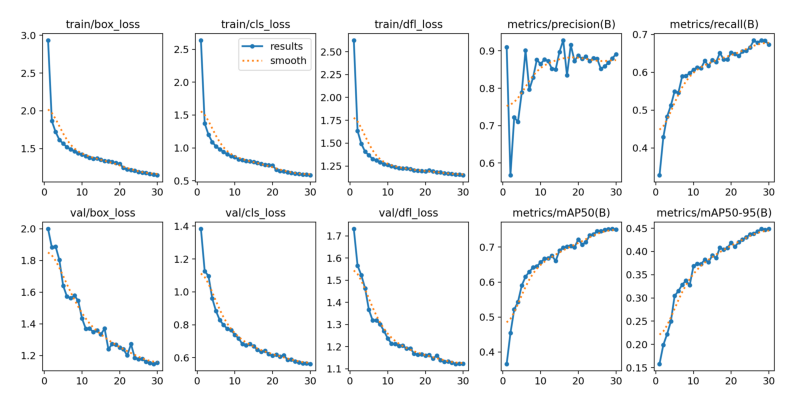

In [ ]:
image = read_image('/content/results.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

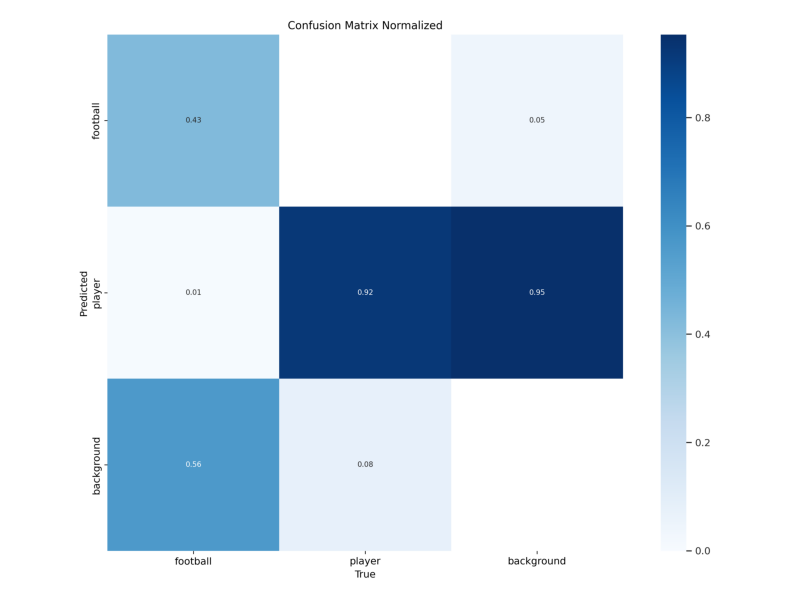

In [ ]:
image = read_image('/content/confusion_matrix_normalized.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
image = read_image('/content/results.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

#Test The Model



In [ ]:
#Evaluate the model on test data
results = model.val(data="/content/football_players_detection/football_players_detection/data.yaml")

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/football_players_detection/football_players_detection/test/labels... 520 images, 23 backgrounds, 0 corrupt: 100%|██████████| 520/520 [00:01<00:00, 470.45it/s]

val: New cache created: /content/football_players_detection/football_players_detection/test/labels.cache



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:19<00:00,  1.73it/s]


                   all        520       2903      0.861      0.676      0.742      0.443
              football        127        145      0.814      0.441      0.544      0.256
                player        494       2758      0.908       0.91      0.939       0.63
Speed: 1.0ms preprocess, 5.5ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/detect/train3


In [ ]:
#Save Test Results

# Source and destination paths
source_dir = '/content/runs/detect/train3'
destination_dir = '/content/drive/My Drive/Visual Recognition Project/model/detect/train3'

# Copy the entire directory
shutil.copytree(source_dir, destination_dir)

'/content/drive/My Drive/Visual Recognition Project/model/detect/train3'

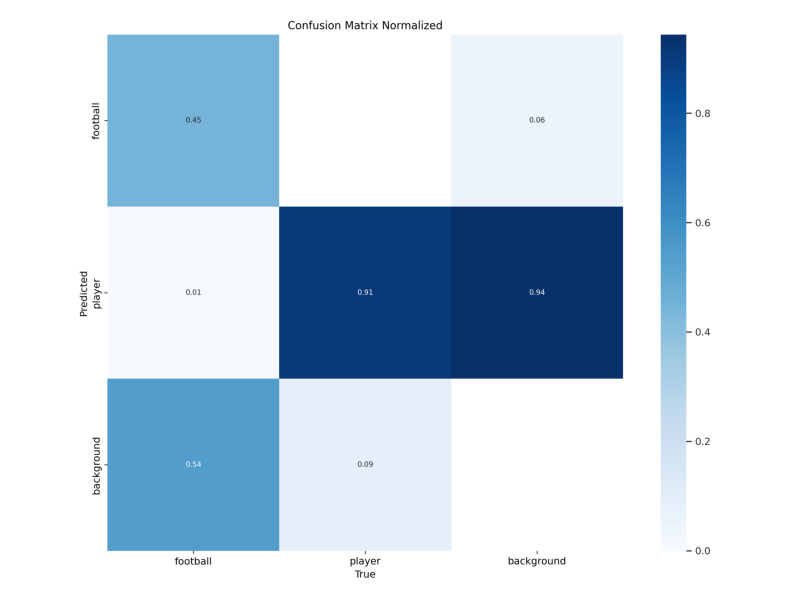

In [ ]:
image = read_image('/content/confusion_matrix_normalized_test.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
# Load a model
loaded_model = YOLO("/content/runs/detect/train/weights/best.pt")  # finetuned YOLOv8n model

# Run batched inference on a list of images
results = loaded_model('/content/football_players_detection/football_players_detection/test/images')  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk


image 1/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.04ca2f20dbf39c3be706d2f14c45bc31.jpg: 640x640 1 football, 4 players, 28.5ms
image 2/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.0ffb40112e9b898eb311651f97b1cf6a.jpg: 640x640 4 players, 31.6ms
image 3/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.7c841f548216975cab8b16676ff2810e.jpg: 640x640 7 players, 23.3ms
image 4/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.7dd2b04546f77f2321ef7c67d7e109d2.jpg: 640x640 14 players, 42.9ms
image 5/520 /content/football_players_detection/football_players_detection/test/images/105_pp_jpg.rf.191815498deea9d88603b9044fa159a3.jpg: 640x640 4 players, 10.0ms
image 6/520 /content/football_players_detection/football_players_detection/test/images/105_pp_jpg.rf.a8007d83f07ddadfd87274a702d32216.jpg: 640x640 10 players, 47

In [ ]:
result[:5]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'football', 1: 'player'}
obb: None
orig_img: array([[[ 22, 155,  99],
        [ 22, 155,  99],
        [ 22, 154, 101],
        ...,
        [  0,  14,   0],
        [  7,  16,   3],
        [  8,  15,   2]],

       [[ 22, 155,  99],
        [ 22, 155,  99],
        [ 22, 154, 101],
        ...,
        [  0,  14,   0],
        [  7,  16,   3],
        [  8,  15,   2]],

       [[ 22, 154, 101],
        [ 22, 154, 101],
        [ 22, 154, 101],
        ...,
        [  0,  14,   0],
        [  7,  16,   3],
        [  8,  15,   2]],

       ...,

       [[  0,  75,  41],
        [  0,  75,  41],
        [  0,  75,  41],
        ...,
        [  0,   9,   0],
        [ 14,  19,  10],
        [ 12,  15,   6]],

       [[  0,  74,  40],
        [  0,  74,  40],
        [  0,  74,  40],
        ...,
        [  0,  10,   0],
        [ 14,  19,  10]

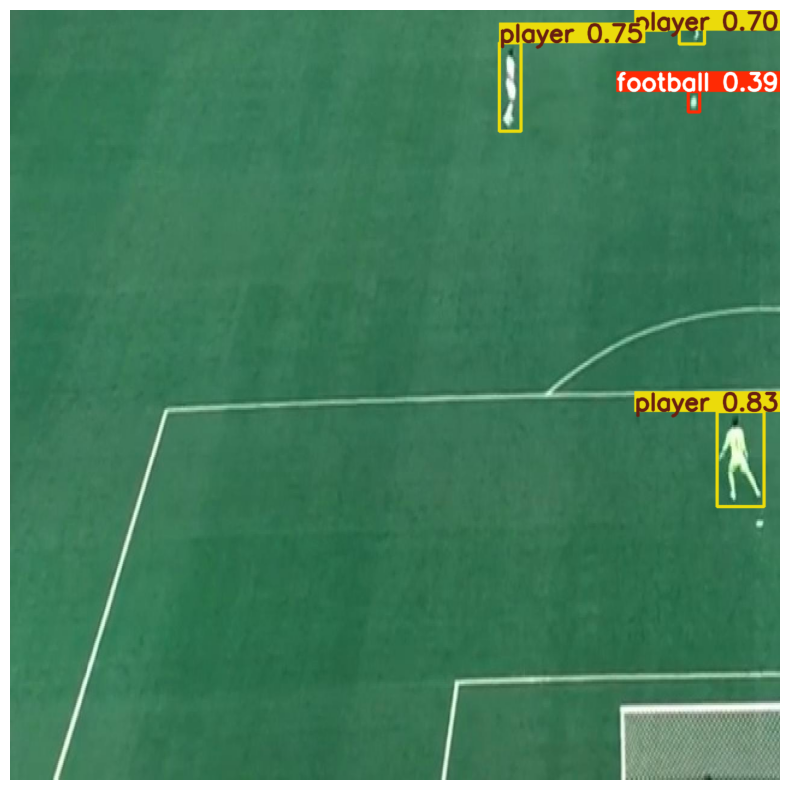

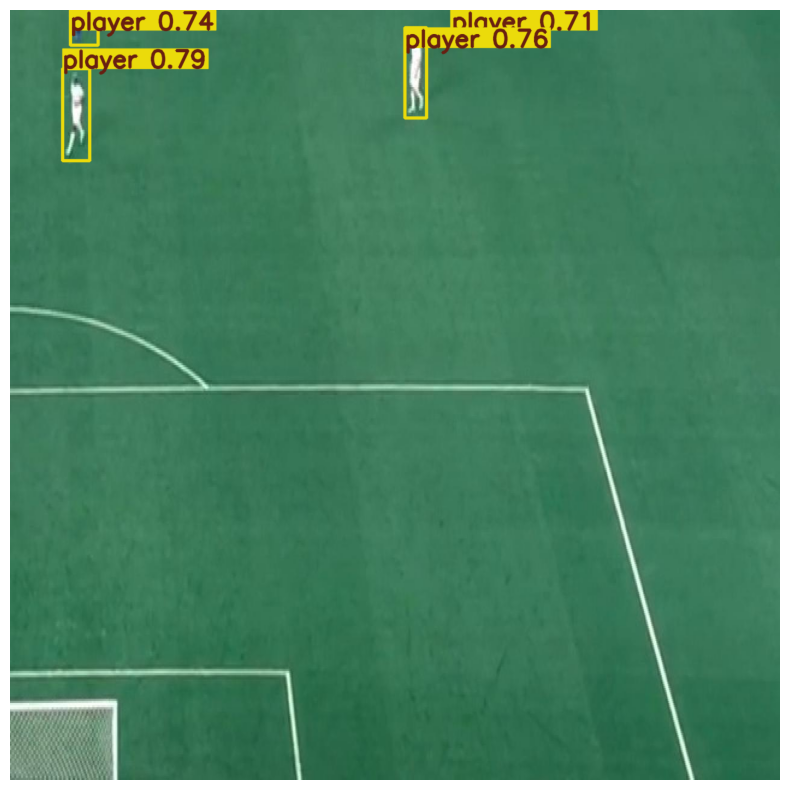

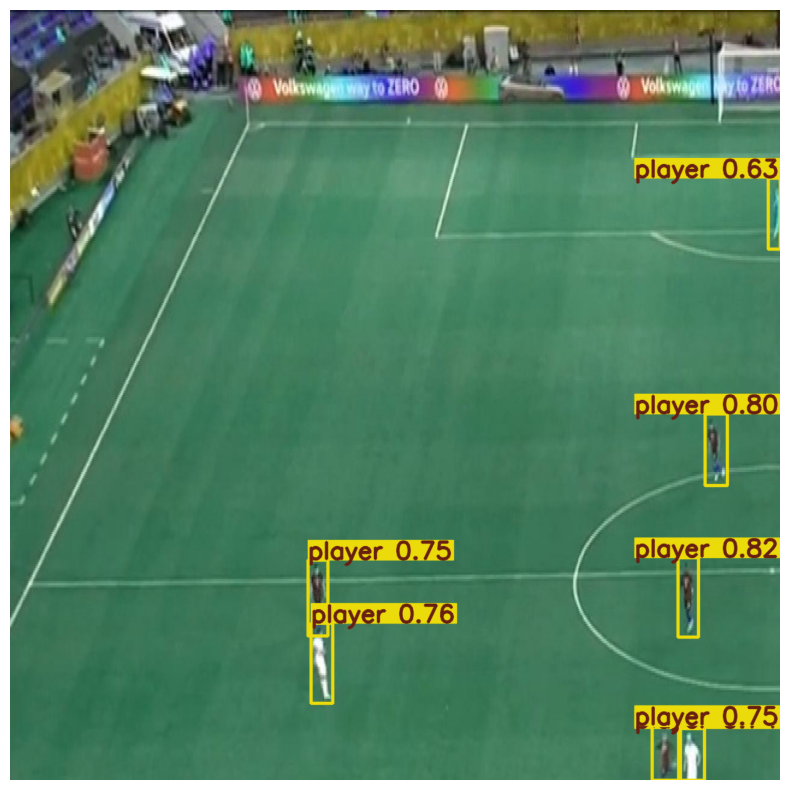

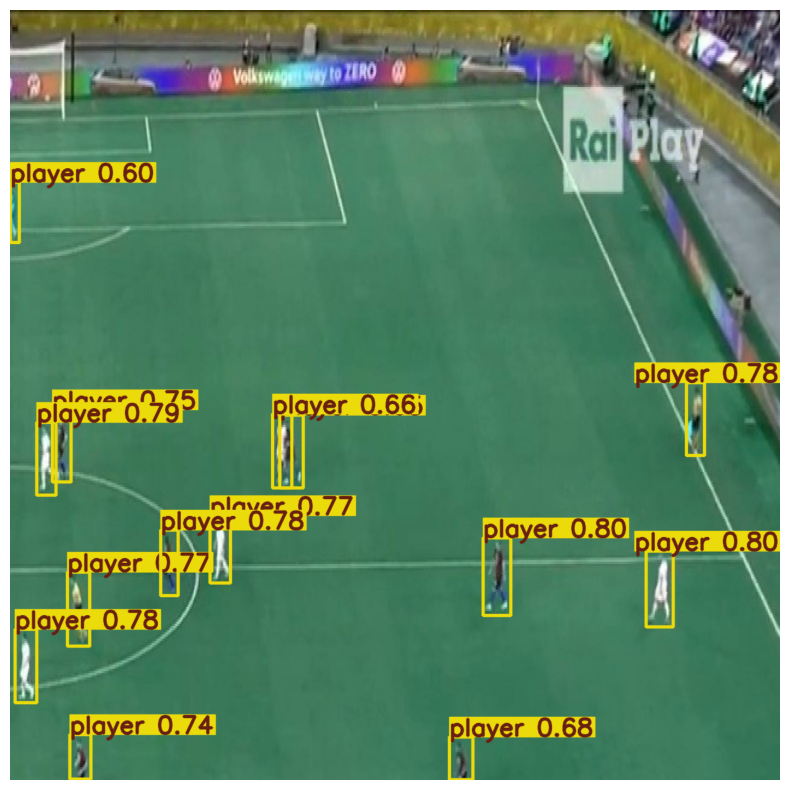

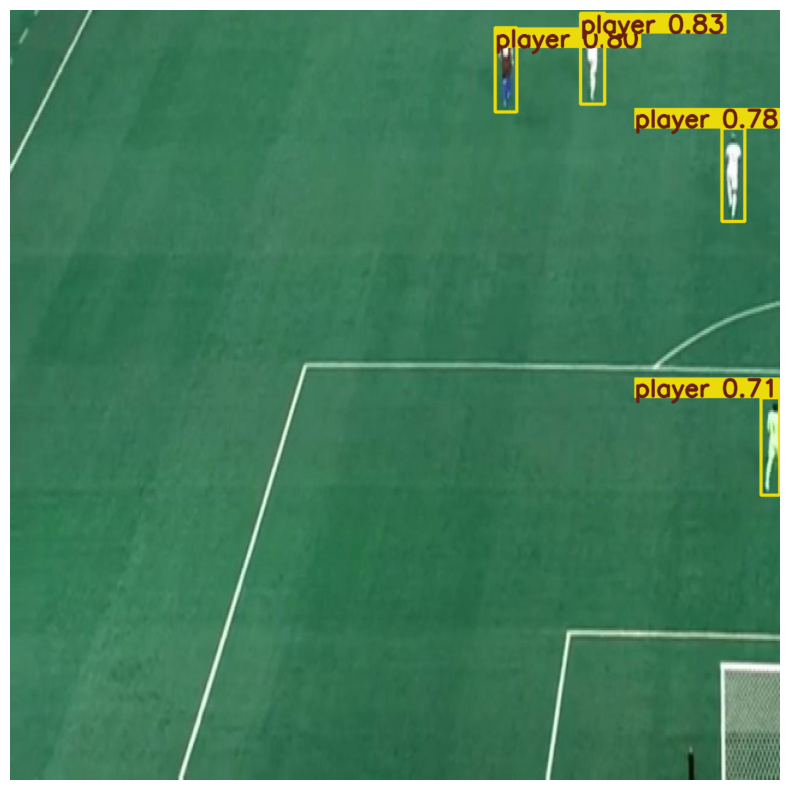

In [ ]:
for result in results[:5]:
  annotated_image = result.plot()
  plt.figure(figsize=(10, 10))
  plt.imshow(annotated_image)
  plt.axis('off')
  plt.show()

In [ ]:
#Test on video
capture = cv2.VideoCapture("test.mp4")
fps = 24
try:
    image = None
    while True:
        returned, frame = capture.read()


        if not returned:
          break
        results = model.track(frame, persist=True)
        frame = results[0].plot()

        jcv2.imshow('frame', frame)
        time.sleep(1/fps)
except KeyboardInterrupt:
    pass
finally:
    jcv2.destroyAllWindows()
    capture.release()

requirements: Ultralytics requirement ['lapx>=0.5.2'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 133.9 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.0s, installed 1 package: ['lapx>=0.5.2']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


WARNING ⚠️ NMS time limit 2.050s exceeded
0: 384x640 7 players, 187.5ms
Speed: 5.6ms preprocess, 187.5ms inference, 2272.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 players, 38.5ms
Speed: 2.0ms preprocess, 38.5ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 players, 22.4ms
Speed: 2.7ms preprocess, 22.4ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 players, 25.4ms
Speed: 3.3ms preprocess, 25.4ms inference, 5.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 24.2ms
Speed: 4.9ms preprocess, 24.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 40.4ms
Speed: 2.5ms preprocess, 40.4ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 23.5ms
Speed: 1.7ms preprocess, 23.5ms inference, 13.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 22.2ms
Speed: 3.1ms preprocess, 22.2ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 63.2ms
Speed: 3.8ms preprocess, 63.2ms inference, 10.4ms postprocess per image at shape

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

#More Training

In [ ]:
#Load the model
model = YOLO("/content/best.pt")

#Train the model
results = model.train(data="/content/football_players_detection/football_players_detection/data.yaml", epochs=30)

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/best.pt, data=/content/football_players_detection/football_players_detection/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

train: Scanning /content/football_players_detection/football_players_detection/train/labels... 10308 images, 623 backgrounds, 0 corrupt: 100%|██████████| 10308/10308 [00:05<00:00, 1889.18it/s]


train: New cache created: /content/football_players_detection/football_players_detection/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/football_players_detection/football_players_detection/valid/labels... 972 images, 30 backgrounds, 0 corrupt: 100%|██████████| 972/972 [00:01<00:00, 907.15it/s]


val: New cache created: /content/football_players_detection/football_players_detection/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.81G      1.276     0.6942      1.174         26        640: 100%|██████████| 645/645 [03:49<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.98it/s]

                   all        972       5407      0.902       0.65      0.729      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.39G      1.307     0.7286      1.191         40        640: 100%|██████████| 645/645 [03:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.85it/s]

                   all        972       5407      0.856      0.648      0.717      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.38G      1.326     0.7502      1.201         14        640: 100%|██████████| 645/645 [03:32<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.72it/s]

                   all        972       5407      0.917      0.632      0.711        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.41G      1.318     0.7456      1.196         23        640: 100%|██████████| 645/645 [03:38<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.58it/s]

                   all        972       5407      0.863      0.666      0.729      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.37G      1.323     0.7413        1.2         23        640: 100%|██████████| 645/645 [03:35<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.88it/s]

                   all        972       5407      0.907      0.632      0.725      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.37G      1.309     0.7332      1.188         12        640: 100%|██████████| 645/645 [03:38<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.75it/s]

                   all        972       5407      0.809      0.676      0.733       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.5G      1.302     0.7298      1.189         17        640: 100%|██████████| 645/645 [03:38<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.70it/s]

                   all        972       5407      0.883      0.642      0.731      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.38G      1.301     0.7225      1.185         58        640: 100%|██████████| 645/645 [03:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:13<00:00,  2.24it/s]

                   all        972       5407      0.819      0.678      0.728      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.43G      1.289     0.7113      1.178         39        640: 100%|██████████| 645/645 [03:34<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.53it/s]

                   all        972       5407      0.839      0.678      0.744      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.38G      1.279     0.7083      1.174         24        640: 100%|██████████| 645/645 [03:33<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  3.94it/s]

                   all        972       5407      0.927      0.654      0.742      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.34G      1.263     0.6922      1.165         31        640: 100%|██████████| 645/645 [03:30<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.98it/s]

                   all        972       5407      0.888      0.667      0.743      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.39G      1.257     0.6893      1.162         14        640: 100%|██████████| 645/645 [03:35<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.77it/s]

                   all        972       5407      0.821      0.687      0.743      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.37G      1.248     0.6775      1.158         12        640: 100%|██████████| 645/645 [03:38<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.86it/s]

                   all        972       5407      0.828       0.68      0.732      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.47G       1.25     0.6807      1.157         21        640: 100%|██████████| 645/645 [03:37<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:10<00:00,  2.90it/s]

                   all        972       5407      0.844      0.671       0.74      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.44G      1.236     0.6798      1.157         19        640: 100%|██████████| 645/645 [03:38<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  4.01it/s]


                   all        972       5407       0.94      0.652      0.747      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.39G      1.224      0.669      1.152         14        640: 100%|██████████| 645/645 [03:42<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:12<00:00,  2.54it/s]

                   all        972       5407       0.93      0.655      0.753      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.38G      1.222     0.6622      1.142         41        640: 100%|██████████| 645/645 [03:34<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.47it/s]

                   all        972       5407      0.862      0.695      0.752      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.43G      1.218     0.6535       1.14         30        640: 100%|██████████| 645/645 [03:40<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.86it/s]


                   all        972       5407      0.891      0.673      0.756      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.37G      1.205     0.6512      1.138         26        640: 100%|██████████| 645/645 [03:39<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.74it/s]

                   all        972       5407      0.849      0.692      0.765      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.38G      1.195     0.6488      1.136         17        640: 100%|██████████| 645/645 [03:40<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  3.92it/s]

                   all        972       5407      0.875        0.7      0.774      0.464


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.63G      1.158     0.5879      1.149         30        640: 100%|██████████| 645/645 [03:31<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.67it/s]

                   all        972       5407      0.868      0.697      0.762      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.35G      1.143      0.577      1.143          4        640: 100%|██████████| 645/645 [03:27<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:09<00:00,  3.36it/s]


                   all        972       5407       0.87      0.714      0.771      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.35G      1.136     0.5713      1.132          5        640: 100%|██████████| 645/645 [03:25<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.67it/s]


                   all        972       5407      0.869      0.716      0.776      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.36G      1.122     0.5614      1.131         13        640: 100%|██████████| 645/645 [03:24<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  3.92it/s]

                   all        972       5407      0.913      0.688      0.775      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.33G      1.113     0.5558      1.124         23        640: 100%|██████████| 645/645 [03:25<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.78it/s]

                   all        972       5407      0.899      0.692      0.773      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.35G      1.109     0.5498      1.124         17        640: 100%|██████████| 645/645 [03:24<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.77it/s]

                   all        972       5407      0.905      0.695      0.781       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.35G      1.104     0.5478      1.121          9        640: 100%|██████████| 645/645 [03:32<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.67it/s]

                   all        972       5407      0.926      0.689      0.782      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.38G      1.092     0.5387      1.116         17        640: 100%|██████████| 645/645 [03:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.79it/s]

                   all        972       5407       0.89      0.705      0.783      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.33G      1.089     0.5416      1.115         10        640: 100%|██████████| 645/645 [03:25<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.77it/s]

                   all        972       5407      0.907      0.706       0.78      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.35G      1.081     0.5354       1.11         10        640: 100%|██████████| 645/645 [03:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  4.02it/s]

                   all        972       5407      0.885       0.72      0.789      0.481



30 epochs completed in 1.876 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


                   all        972       5407      0.907      0.706      0.781      0.484
              football        241        275      0.869      0.495      0.614       0.31
                player        936       5132      0.944      0.917      0.948      0.658
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/train


In [ ]:
#Save Model

# Source and destination paths
source_dir = '/content/runs'
destination_dir = '/content/drive/My Drive/Visual Recognition Project'

# Copy the entire directory
shutil.copytree(source_dir, destination_dir)

'/content/drive/My Drive/Visual Recognition Project'

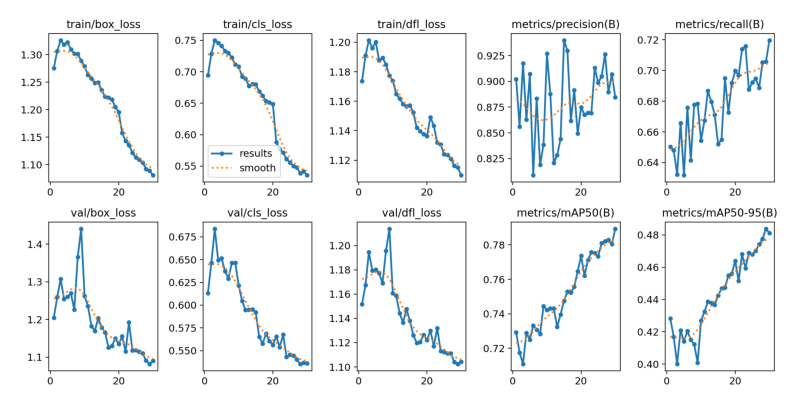

In [ ]:
image = read_image('/content/results 2.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

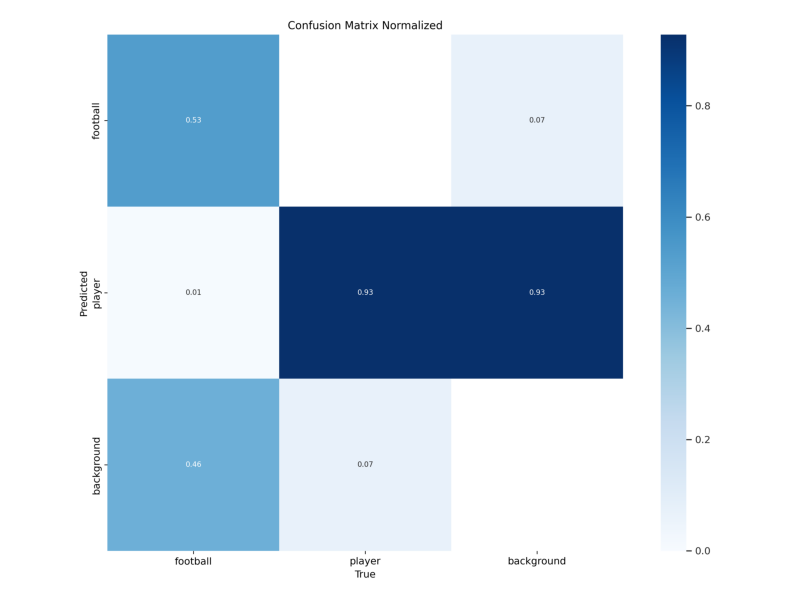

In [ ]:
image = read_image('/content/confusion_matrix_normalized 2.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
#Evaluate the model on test data
results = model.val(data="/content/football_players_detection/football_players_detection/data.yaml")

Ultralytics YOLOv8.2.84 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/football_players_detection/football_players_detection/test/labels... 520 images, 23 backgrounds, 0 corrupt: 100%|██████████| 520/520 [00:00<00:00, 1308.46it/s]


val: New cache created: /content/football_players_detection/football_players_detection/test/labels.cache


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:19<00:00,  1.71it/s]


                   all        520       2903      0.908      0.683      0.781      0.472
              football        127        145      0.871      0.467      0.621      0.298
                player        494       2758      0.945      0.899      0.941      0.647
Speed: 0.8ms preprocess, 5.7ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
#Save test results

# Source and destination paths
source_dir = '/content/runs/detect/train2'
destination_dir = '/content/drive/My Drive/Visual Recognition Project/test'

# Copy the entire directory
shutil.copytree(source_dir, destination_dir)

'/content/drive/My Drive/Visual Recognition Project/test'

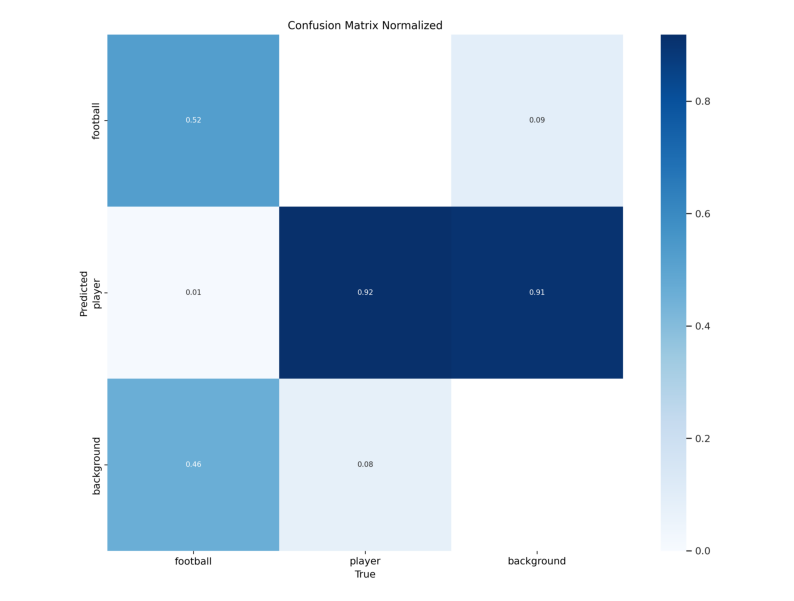

In [ ]:
image = read_image('/content/confusion_matrix_normalized_test 2.png')
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
# Load a model
#loaded_model = YOLO("/content/runs/detect/train/weights/best.pt")  # finetuned YOLOv8n model

# Run batched inference on a list of images
results = model('/content/football_players_detection/football_players_detection/test/images')  # return a list of Results objects

# Process results list
for result in results[:5]:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk


image 1/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.04ca2f20dbf39c3be706d2f14c45bc31.jpg: 640x640 1 football, 4 players, 9.0ms
image 2/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.0ffb40112e9b898eb311651f97b1cf6a.jpg: 640x640 4 players, 7.4ms
image 3/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.7c841f548216975cab8b16676ff2810e.jpg: 640x640 7 players, 7.4ms
image 4/520 /content/football_players_detection/football_players_detection/test/images/102_pp_jpg.rf.7dd2b04546f77f2321ef7c67d7e109d2.jpg: 640x640 1 football, 14 players, 7.4ms
image 5/520 /content/football_players_detection/football_players_detection/test/images/105_pp_jpg.rf.191815498deea9d88603b9044fa159a3.jpg: 640x640 4 players, 7.4ms
image 6/520 /content/football_players_detection/football_players_detection/test/images/105_pp_jpg.rf.a8007d83f07ddadfd87274a702d32216.jpg: 640x640 10 play

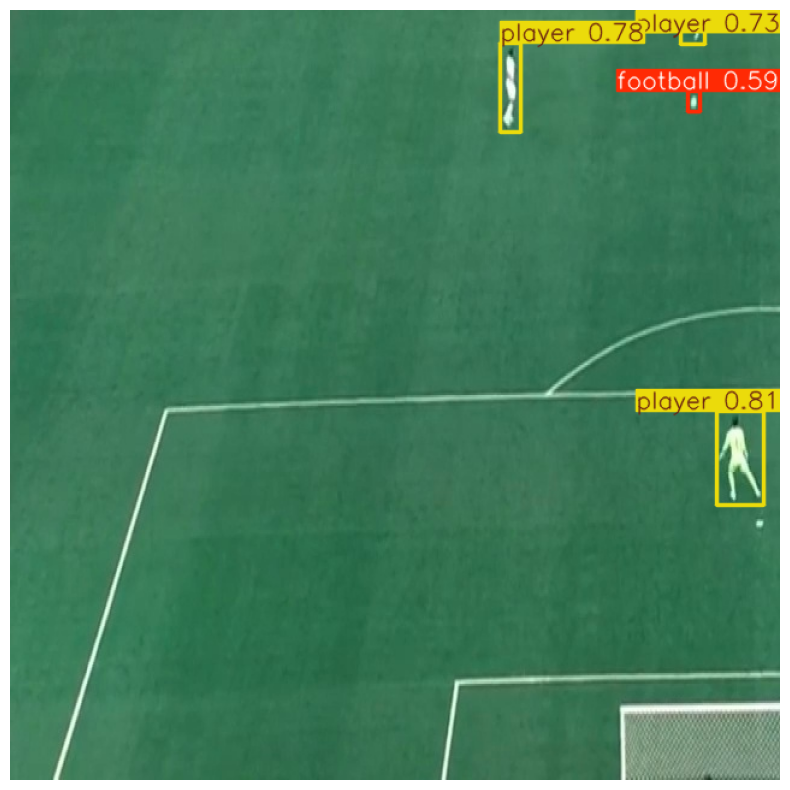

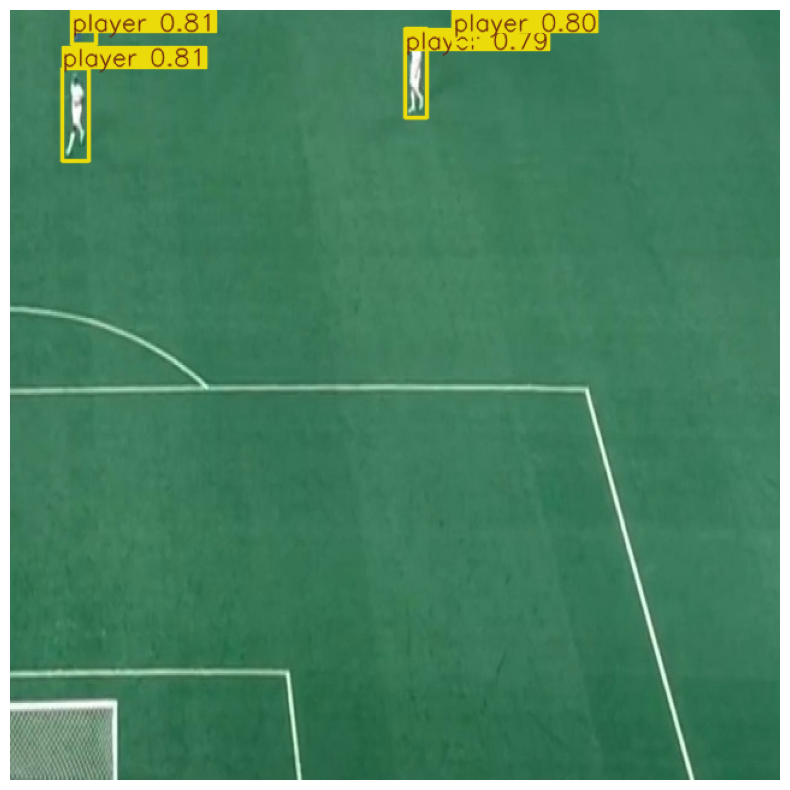

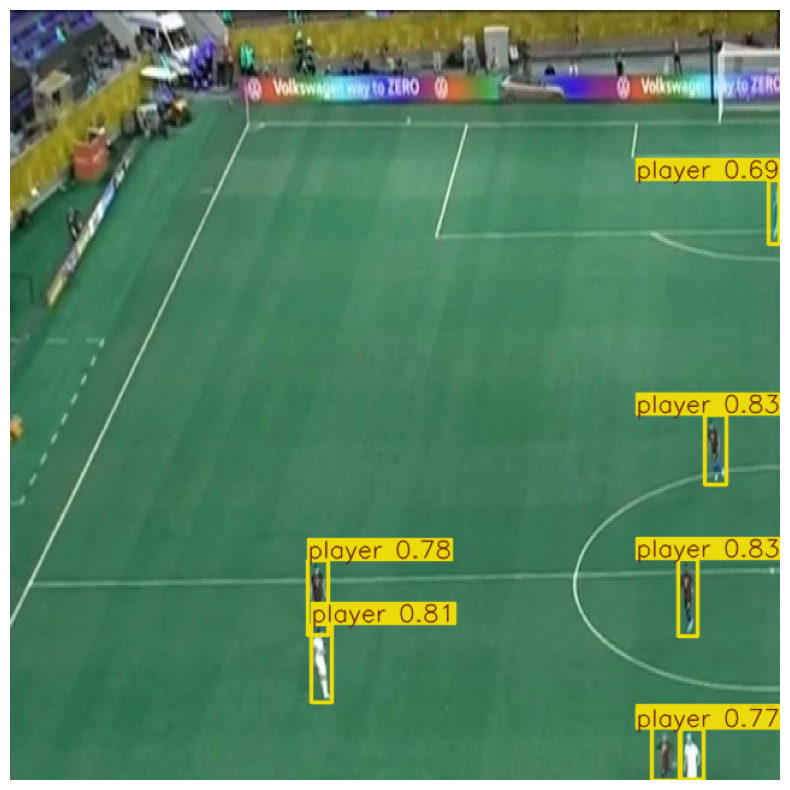

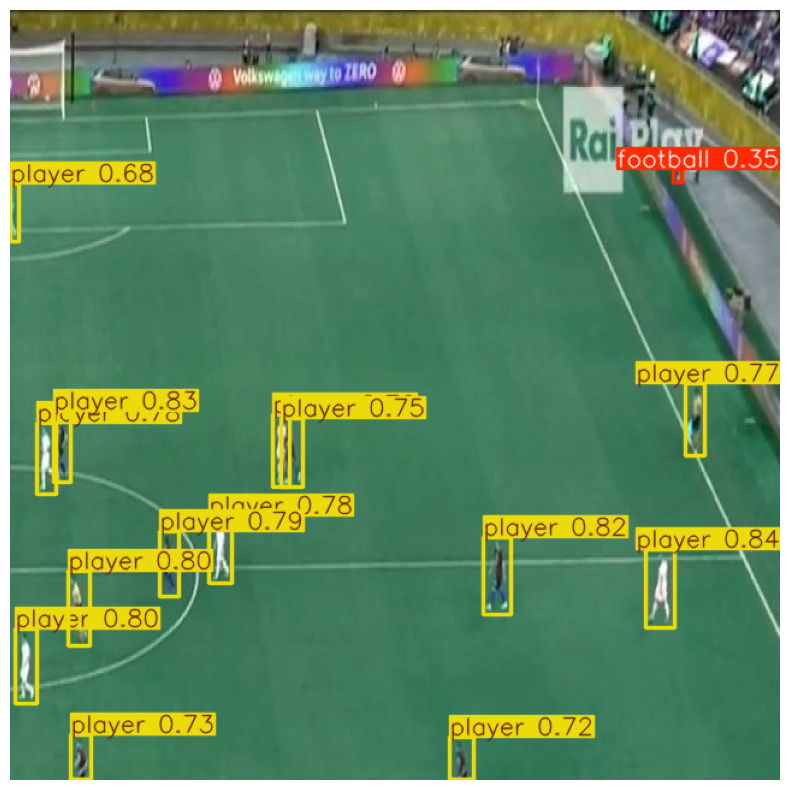

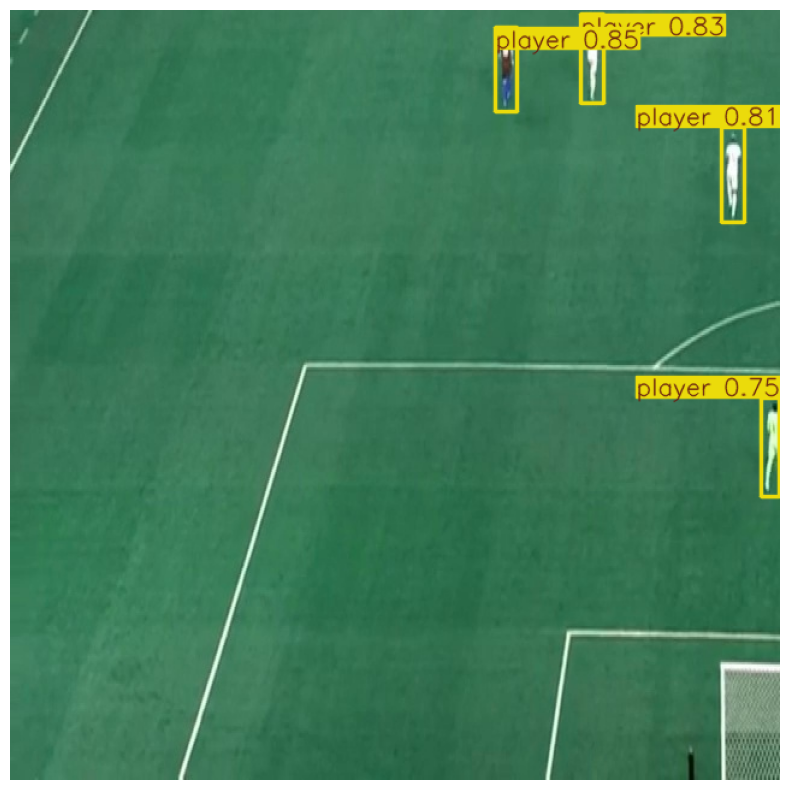

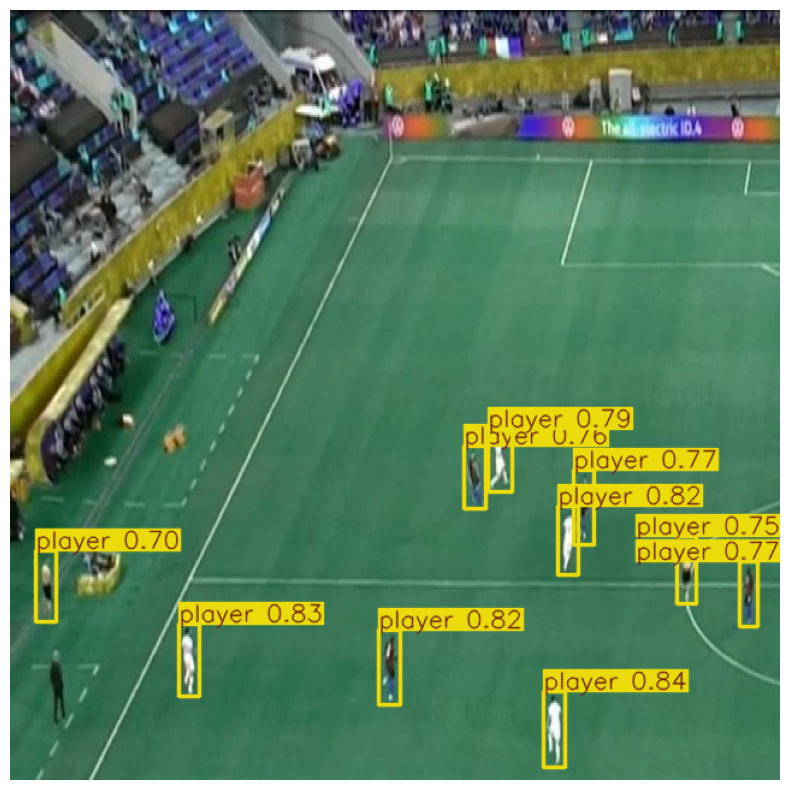

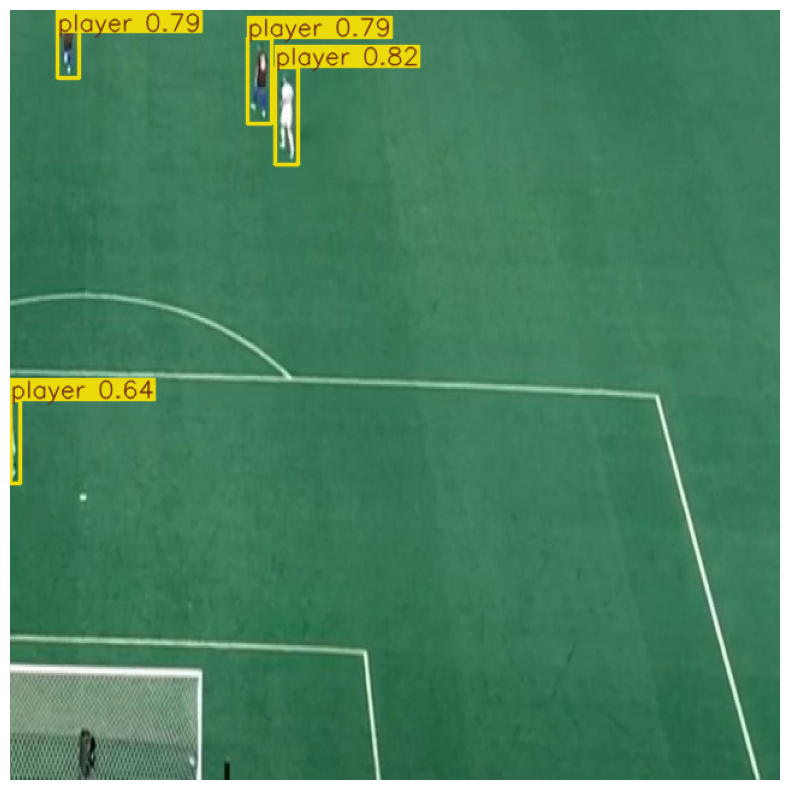

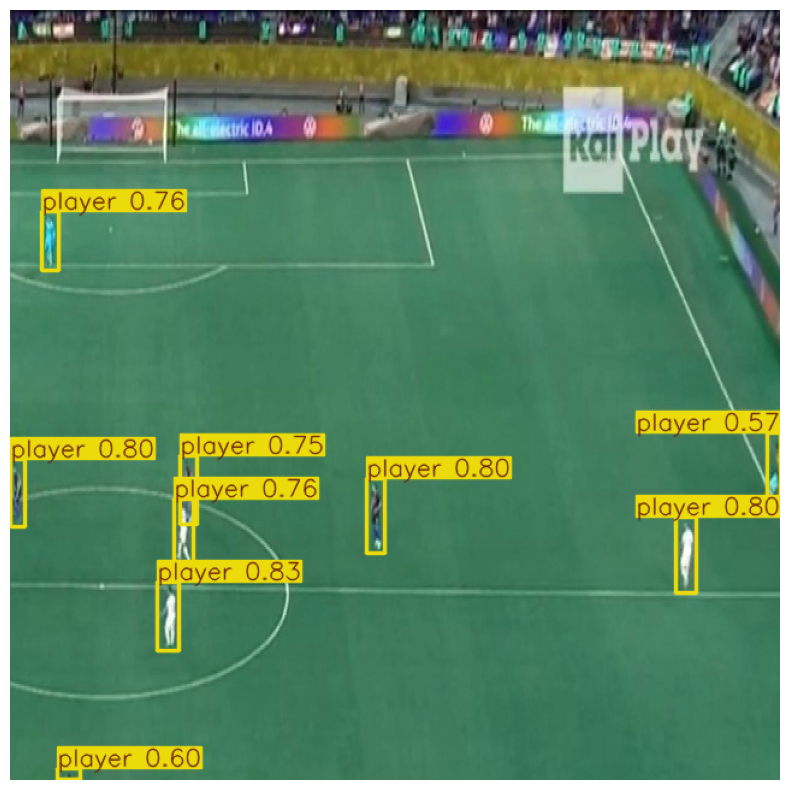

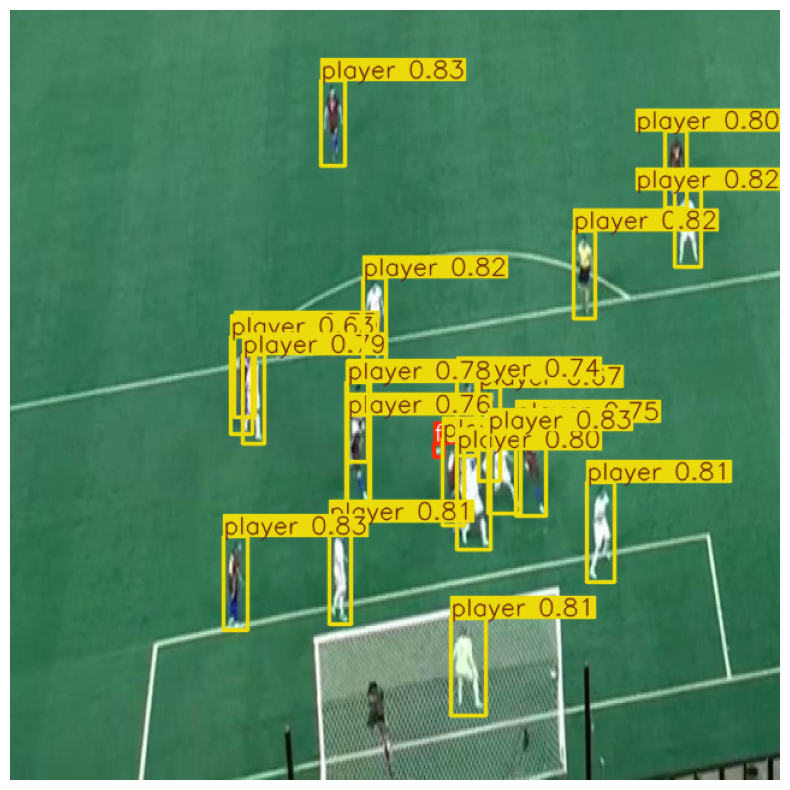

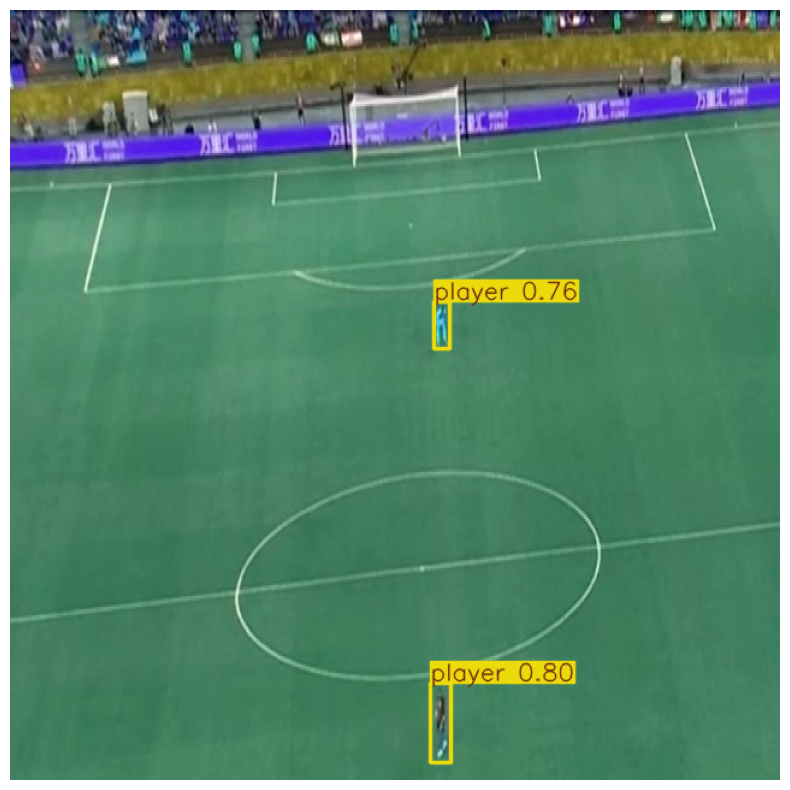

In [ ]:
for result in results[:10]:
  annotated_image = result.plot()
  plt.figure(figsize=(10, 10))
  plt.imshow(annotated_image)
  plt.axis('off')
  plt.show()

In [ ]:
#Test on video

capture = cv2.VideoCapture("test.mp4")
fps = 24
try:
    image = None
    while True:
        returned, frame = capture.read()


        if not returned:
          break
        results = model.track(frame, persist=True)
        frame = results[0].plot()

        jcv2.imshow('frame', frame)
        time.sleep(1/fps)
except KeyboardInterrupt:
    pass
finally:
    jcv2.destroyAllWindows()
    capture.release()


0: 384x640 6 players, 21.2ms
Speed: 1.6ms preprocess, 21.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 players, 19.5ms
Speed: 1.7ms preprocess, 19.5ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 19.6ms
Speed: 1.8ms preprocess, 19.6ms inference, 12.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 24.4ms
Speed: 1.7ms preprocess, 24.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 75.1ms
Speed: 3.1ms preprocess, 75.1ms inference, 28.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 24.8ms
Speed: 3.4ms preprocess, 24.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 13.4ms
Speed: 1.7ms preprocess, 13.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 players, 23.2ms
Speed: 1.8ms preprocess, 23.2ms inference, 2.2ms postprocess per image at shape